In [1]:
import numpy as np
import pandas as pd
import librosa.display
import soundfile as sf
import scipy.signal as signal
import matplotlib.pyplot as plt
import IPython
import seaborn as sns
sns.set()

CHENGENG001@e.ntu.edu.sg

# Data Set Source
The <a href="https://www.kaggle.com/datasets/rtatman/british-birdsong-dataset">British Birdsong Dataset</a>  

## About Dataset
### Context:
Birds use songs and calls of varying length and complexity to attract mates, warn of nearby danger and mark their territory. This dataset contains a recordings of different birdsongs from bird species that can be found in Britain (although the recordings themselves are from many different locations).

### Content:
This is a dataset of bird sound recordings, a specific subset gathered from the Xeno Canto collection to form a balanced dataset across 88 species commonly heard in the United Kingdom. It was originally compiled by Dan Stowell and shared on Archive.org.

The copyright in each audio file is owned by the user who donated the file to Xeno Canto. Please see `"birdsong_metadata.tsv"` for the full listing, which gives the authors' names and the CC licences applicable for each file. The audio files are encoded as `.flac` files.

### Acknowledgements:
These recordings were collected by 68 separate birding enthusiasts and uploaded to and stored by xeno-canto: www.xeno-canto.org. If you make use of these recordings in your work, please cite the specific recording and include acknowledgement of and a link to the xeno-canto website.

# References
- <a>https://github.com/IliaZenkov/sklearn-audio-classification/blob/master/sklearn_audio_classification.ipynb</a>

# Motivation

We perceive bird songs to be distinctive and that different birds would likely produce different kind songs charactersitic of their species. Yet, it is often very diffiult to get a clear, full view of the particular bird as it may be well hidden within the depths of the forest, or it is simply too skittish and would fly away as we approach. By matching the audio features of bird songs to the species, we can help improve conservation efforts, allowing researchers to identify and estimate the population size of a particular species. Another benefit is to allow the general public, not just experienced bird watchers, to appreciate the diversity and beauty of nature in a different way. 

This project is by no means, anything close to new or groundbreaking. Yet, we find it interesting to process unstructured data and wish to explore beyond the curriculum of this module. Afterall, most of what we percieve in the real world are indeed unstructured data. This project serves as the invaluable learning experience for our team

# Metadata analysis

In [2]:
meta_data = pd.read_csv('./bird/birdsong_metadata.csv')
meta_data.head()

,file_id,genus,species,english_cname,who_provided_recording,country,latitude,longitute,type,license
0,132608,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"female, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/
1,132611,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"flight call, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/
2,35068,Acanthis,flammea,Common Redpoll,Sander Bot,Netherlands,52.8176,6.4326,"call, song",http://creativecommons.org/licenses/by-nc-nd/2.5/
3,82715,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/
4,64685,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/


## Descriptions of Variables  
- `file_id`:
- `genus`:
- `species`:
- `english_cname`:
- `who_provided_recording`:
- `country`:
- `latitude`:
- `longitute`:
- `type`:
- `license`:

First and foremost, we need to understand the data that we are working on. One important thing is to know how many speicies of birds are there and the distributions of their number of recordings.

In [3]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   file_id                 264 non-null    int64  
 1   genus                   264 non-null    object 
 2   species                 264 non-null    object 
 3   english_cname           264 non-null    object 
 4   who_provided_recording  264 non-null    object 
 5   country                 264 non-null    object 
 6   latitude                261 non-null    float64
 7   longitute               261 non-null    float64
 8   type                    264 non-null    object 
 9   license                 264 non-null    object 
dtypes: float64(2), int64(1), object(7)
memory usage: 20.8+ KB


<Axes: xlabel='english_cname'>

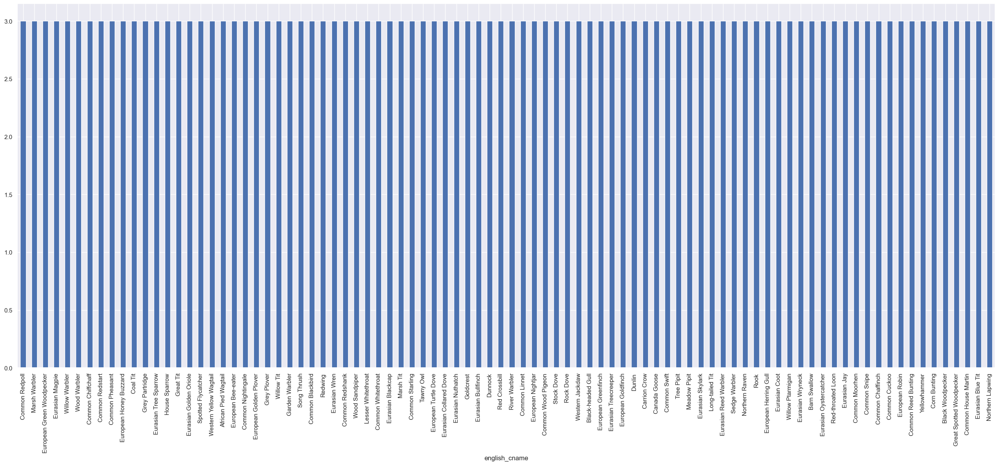

In [4]:
f = plt.figure(figsize=(32,12))
meta_data['english_cname'].value_counts().plot(kind='bar')

In [5]:
meta_data['english_cname'].describe()

count                264
unique                88
top       Common Redpoll
freq                   3
Name: english_cname, dtype: object

In [6]:
meta_data['english_cname'].value_counts()

english_cname
Common Redpoll               3
Marsh Warbler                3
European Green Woodpecker    3
Eurasian Magpie              3
Willow Warbler               3
                            ..
Black Woodpecker             3
Great Spotted Woodpecker     3
Common House Martin          3
Eurasian Blue Tit            3
Northern Lapwing             3
Name: count, Length: 88, dtype: int64

In [7]:
meta_data['english_cname'].value_counts().describe()

count    88.0
mean      3.0
std       0.0
min       3.0
25%       3.0
50%       3.0
75%       3.0
max       3.0
Name: count, dtype: float64

It looks like we have **88** unique bird species (based on their English common names), and every species have exactly **3** recordings. This is because the **standard deviation** of the `value_counts()` data is **0** and the **mean** is **0**. This tells us that we have a balanced number of classes.

Next, we will also be looking at the distribution of the locations that these recordings were made. We see that most of the recordings were taken in the United Kingdom. 

<Axes: xlabel='country'>

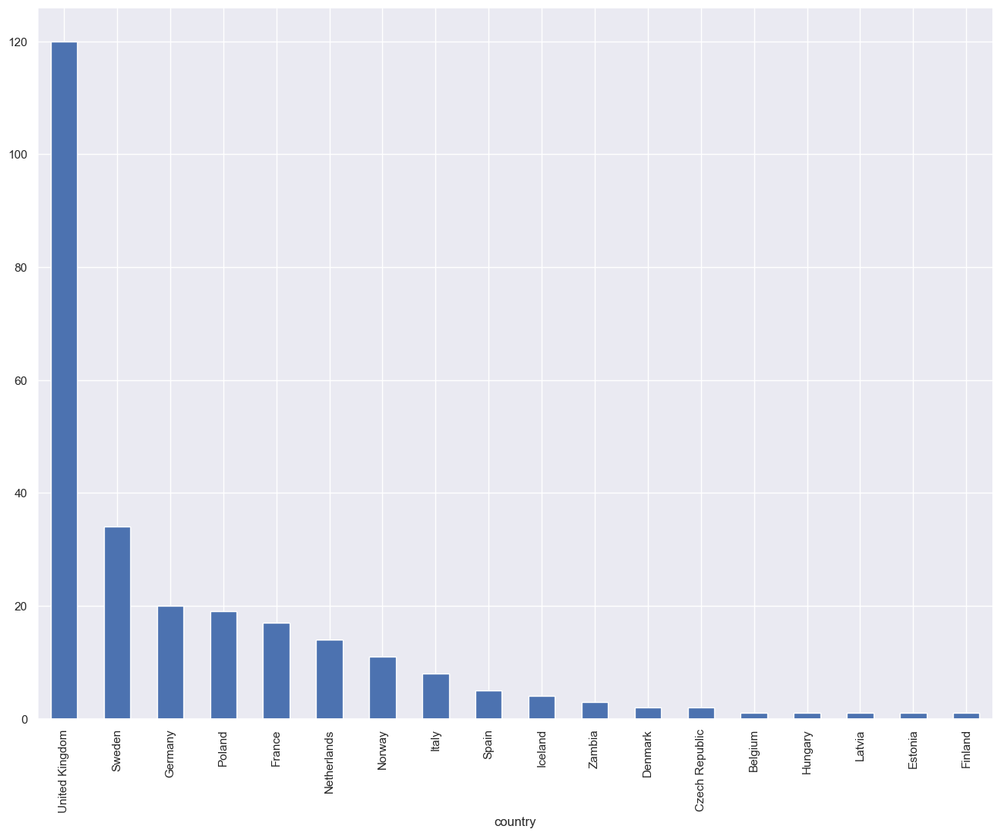

In [8]:
f = plt.figure(figsize=(16, 12))
meta_data['country'].value_counts().plot(kind='bar')

# **Audio Analysis**  

Next, we will explore the audio data. Just as we need a decent foundational understanding of statistics for general numeric analysis, we also need to understand how sound works.

## **Understanding Sound and Wave**

Sound is a mechanical disturbance from a state of equilibrium that propagates through an elastic material medium <a href="https://www.britannica.com/science/sound-physics">[1]</a>

(to include brief explanation)  

A wave form contains **measurable** information such as the `amplitude` and `period`.   

Amplitude is the the maximum displacement or distance moved by a point on a vibrating body or wave measured from its equilibrium position <a href="https://www.britannica.com/science/amplitude-physics">[2]</a>. Amplitude is what we percieve *"loudness"* to be, a positive relationship. 

Period is the interval of time it takes for a motion to repeat <a href="https://www.britannica.com/science/period-physics">[3]</a>. Particularly, we are interested in the *frequency*. Frequency is such that  

$frequency = \frac{1}{period}$

it is how we perceive *"pitch"* to be, a positive relationship.  

Another important concept is the *intensity* of sound. It is the ratio between the energy of the wave propagation and the area it is directed to.  **Decibel** measures  the ratio between two intensities, such as the relative loudness of sounds <a href="https://www.britannica.com/science/decibel">[4]</a>. Sometimes, we would use the reference intensity of the **threshold of hearing**, which is the lowest intensity of sound that is audible.

## **Digital representation of Sound**

Sound in real world is an analog data, which is **continuous** and can take **infinite** range. We try to replicate and represent this analog data in a digital data, which is **discrete**, and takes **limited** range. The resultant ADC(analog-to-digital conversion) of sound, is **digital audio signal**, also known as **pulse-code modulation**.

### The ADC Process

There are broadly, two steps in the ADC process.
- Sampling
- Qunatisation

(to include brief explanation)

**Sampling** refers to taking the *array* of amplitudes occuring at each constant interval, $T$. The **sampling rate**, $S_r$ is given by $S_r = \frac{1}{T}$. The sampling rate represents the number of samples that we have in each second of the digital signal.  

In quantisation, we group amplitude values closest to the assigned discrete **quantisation values**, which introduces **quanitsation error**. The higher the **quantisation resolution** (more discrete quantisation values), the lower the **quantisation error**. 

# Time Domain Exploration

We will be looking at two samples of the same species, the **Common Redpoll**. Play the audio clip to have a sense of how the bird song sounds like.

In [31]:
# Function Definitions

# plots a waveform graph for ONE sample
def plot_waveform(address, title):
    with sf.SoundFile(address) as audio:
        waveform = audio.read()
        sample_rate = audio.samplerate
        plt.figure(figsize=(16,12))
        librosa.display.waveshow(waveform, sr=sample_rate, color="blue")
        plt.xlabel('Time / s')
        plt.ylabel('Amplitude')
        plt.title(title)

# get basic information of the audio clip
def get_basic_info(path):
    audioData, sampleRate = librosa.load(path)
    print("Duration of audio clip:",librosa.get_duration(path=path))
    print("Shape of audio clip (one parameter for mono, two for stereo):", audioData.shape)
    print("Sample Rate of aduio clip:", sampleRate)

# Draw the spectrogram using Short-time-Fourier-Transformation
def plot_stft(path, title):
    with sf.SoundFile(path) as audio:
        waveform = audio.read()
        sample_rate = audio.samplerate
    stft_spectrum_matrix = librosa.stft(waveform)
    plt.figure(figsize=(16, 12))
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(stft_spectrum_matrix), ref=np.max),y_axis='log', x_axis='time')
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    

Bird song sample `xc132608` of the **Common Redpoll**

In [10]:
IPython.display.Audio("./bird/songs/songs/xc132608.flac")

We check the basic information of the audio clip

In [23]:
get_basic_info("./bird/songs/songs/xc132608.flac")

Duration of audio clip: 38.55673469387755
Shape of audio clip (one parameter for mono, two for stereo): (850176,)
Sample Rate of aduio clip: 22050


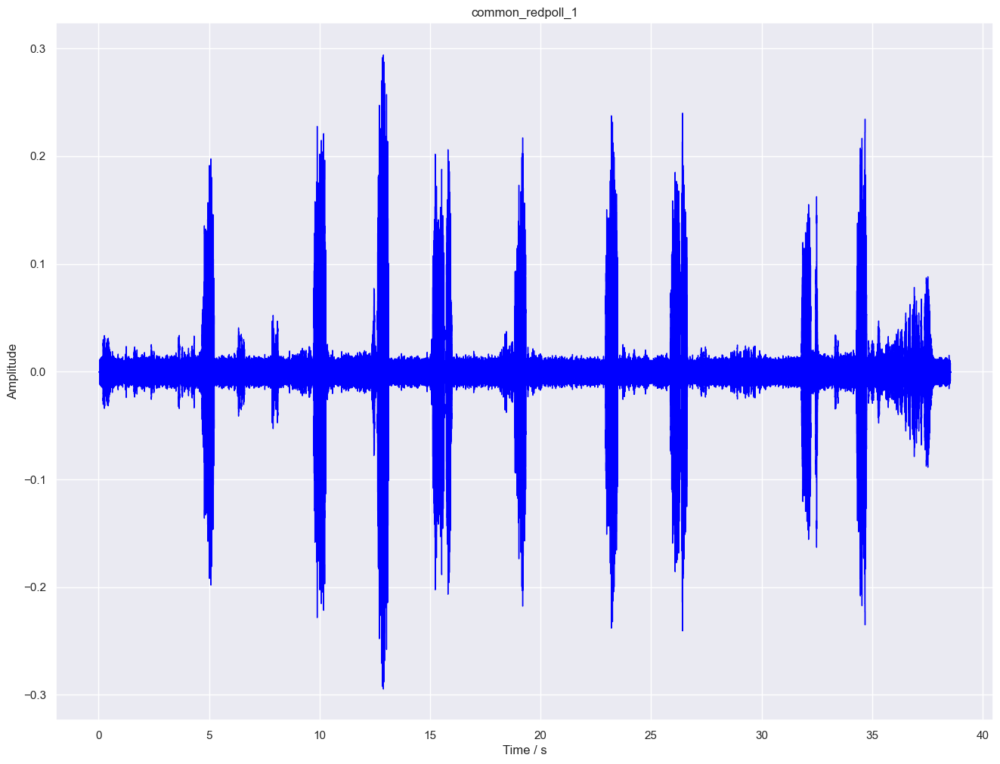

In [11]:
plot_waveform("./bird/songs/songs/xc132608.flac", "common_redpoll_1")

Bird song sample `xc132611` of the **Common Redpoll**

In [26]:
IPython.display.Audio("./bird/songs/songs/xc132611.flac")

Basic information of the audio clip

In [25]:
get_basic_info("./bird/songs/songs/xc132611.flac")

Duration of audio clip: 12.695510204081632
Shape of audio clip (one parameter for mono, two for stereo): (279936,)
Sample Rate of aduio clip: 22050


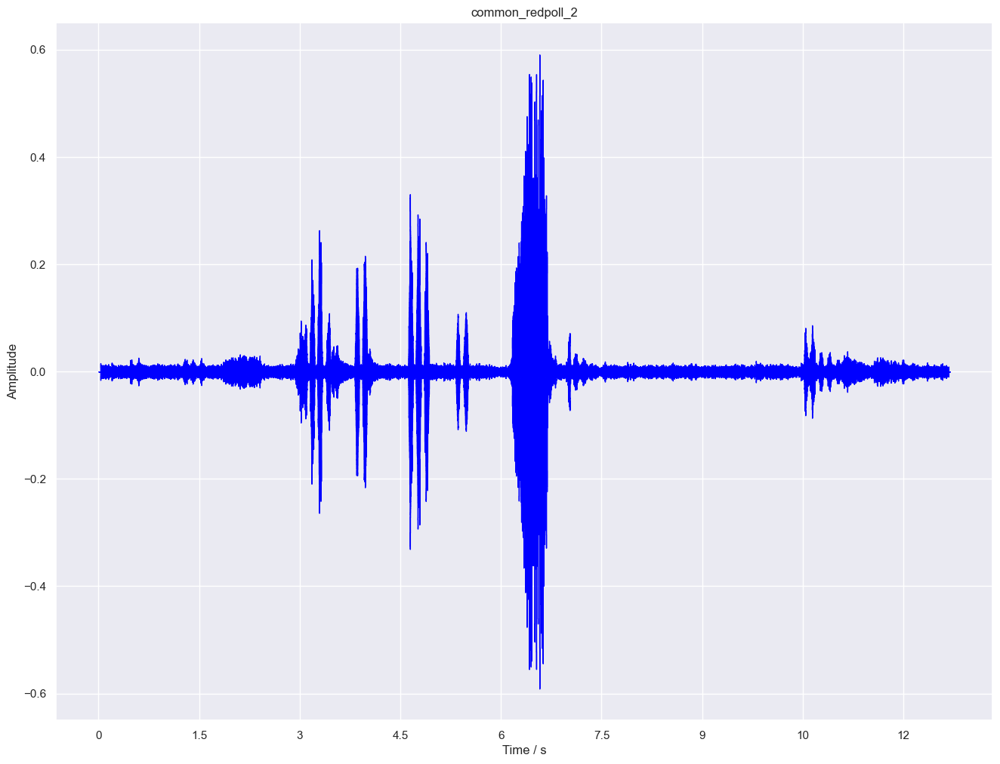

In [13]:
plot_waveform("./bird/songs/songs/xc132611.flac", "common_redpoll_2")

The following are two samples from the **Marsh Warbler**

Audio sample `xc82715` of **Marsh Warbler**

In [14]:
IPython.display.Audio("./bird/songs/songs/xc82715.flac")

In [27]:
get_basic_info("./bird/songs/songs/xc82715.flac")

Duration of audio clip: 16.22204081632653
Shape of audio clip (one parameter for mono, two for stereo): (357696,)
Sample Rate of aduio clip: 22050


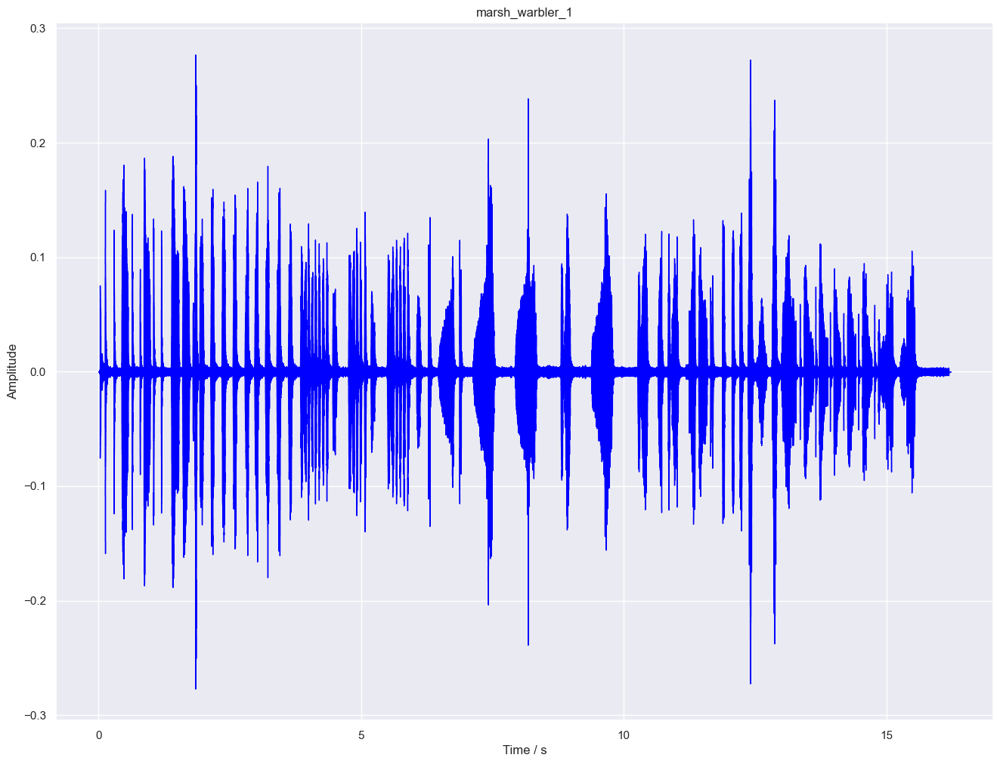

In [15]:
plot_waveform("./bird/songs/songs/xc82715.flac", "marsh_warbler_1")

Audio sample `xc6485` of **Marsh Warbler**

In [16]:
IPython.display.Audio("./bird/songs/songs/xc64685.flac")

In [28]:
get_basic_info("./bird/songs/songs/xc64685.flac")

Duration of audio clip: 12.93061224489796
Shape of audio clip (one parameter for mono, two for stereo): (285120,)
Sample Rate of aduio clip: 22050


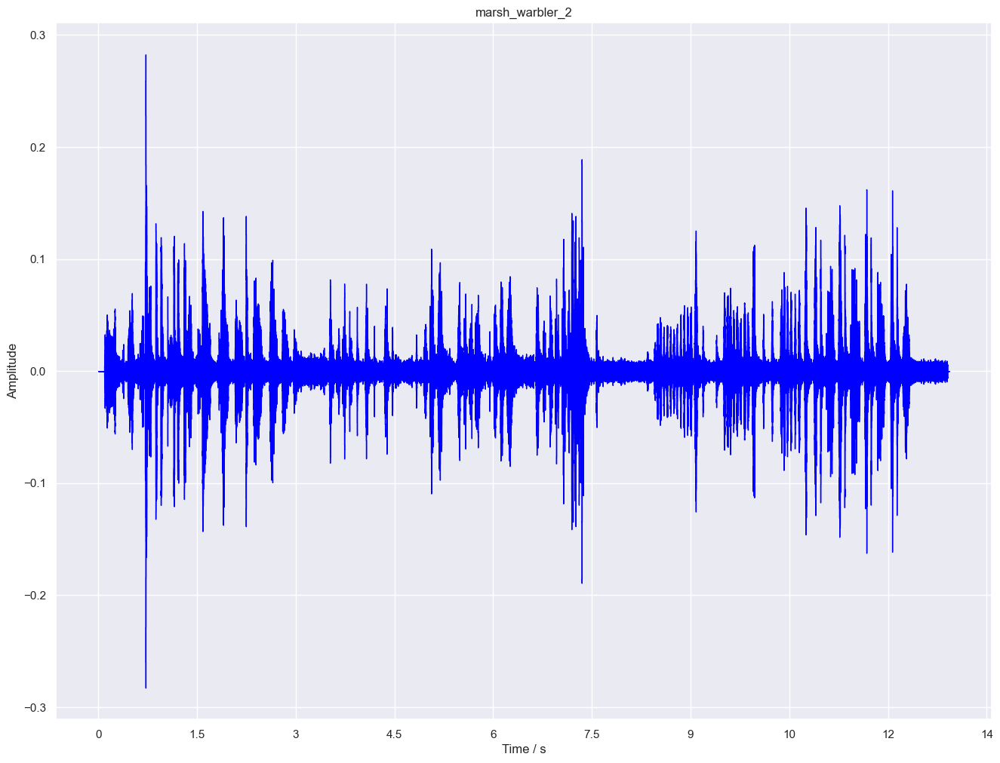

In [17]:
plot_waveform("./bird/songs/songs/xc64685.flac", "marsh_warbler_2")

# Frequency Domain

# Time-frequency Domain

be ware of spectral leakage. The need to apply windowing function. Mention how this is abstracted by the function

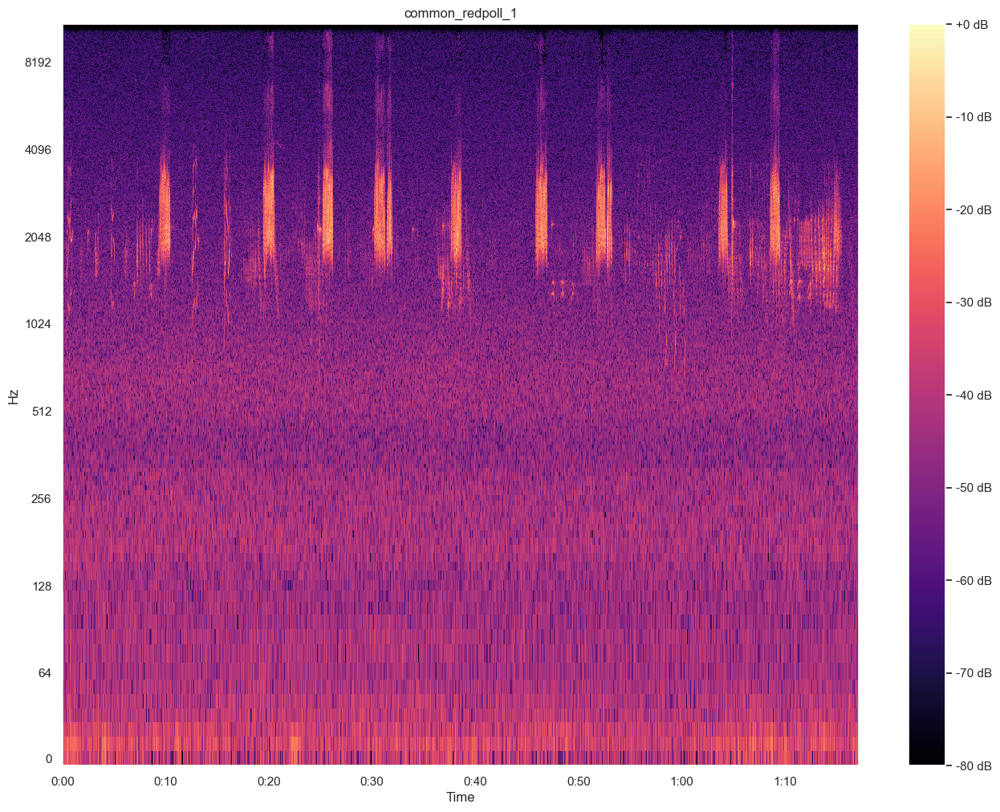

In [35]:
plot_stft("./bird/songs/songs/xc132608.flac", "common_redpoll_1")

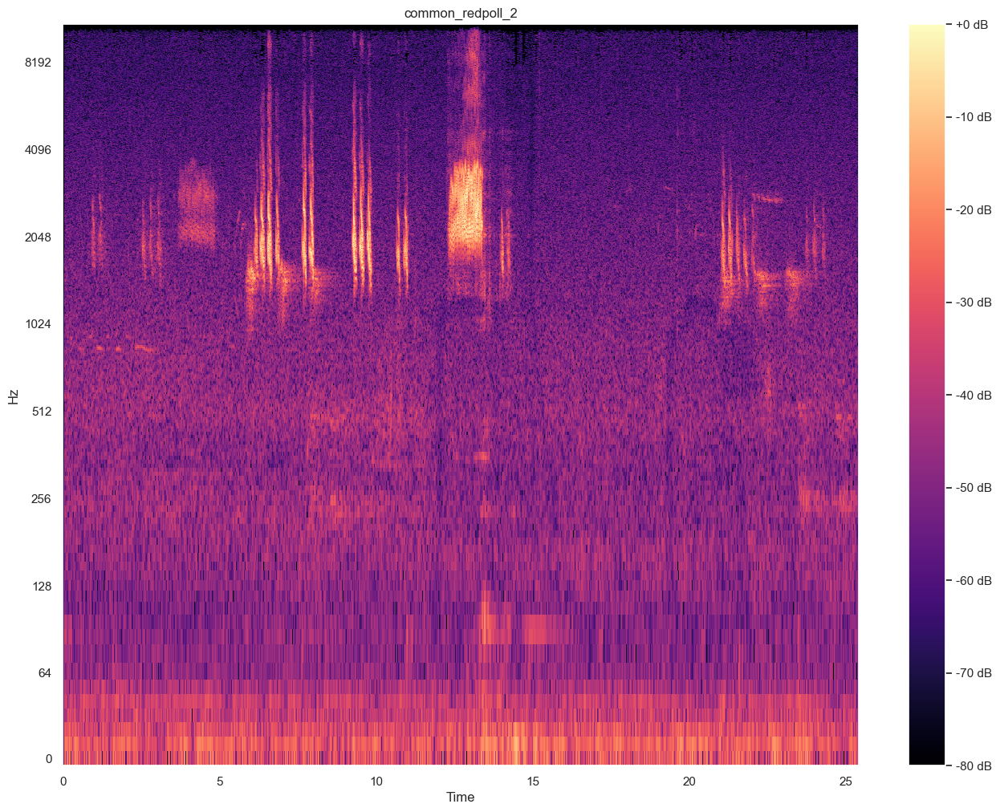

In [34]:
plot_stft("./bird/songs/songs/xc132611.flac", "common_redpoll_2")

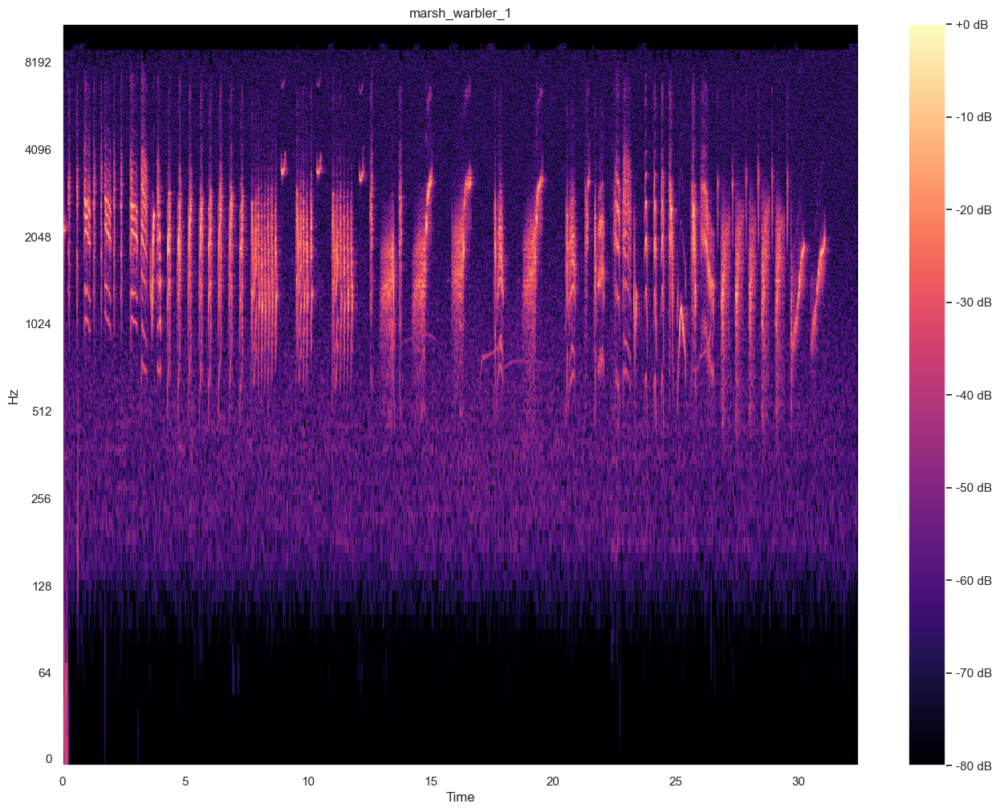

In [33]:
plot_stft("./bird/songs/songs/xc82715.flac", "marsh_warbler_1")

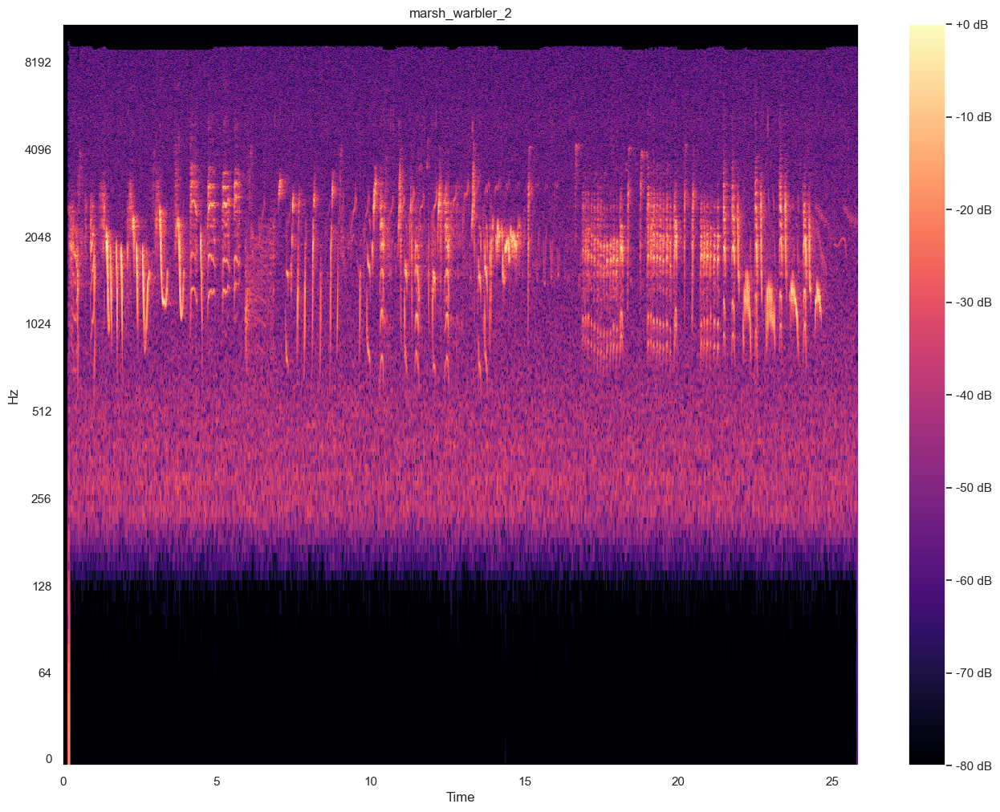

In [32]:
plot_stft("./bird/songs/songs/xc64685.flac", "marsh_warbler_2")

# Intelligent Audio Systems

There are generally two ways in which we can train our models in audio data. The first is by picking important audio features and passing it to a Machine Learning model. The second way is by passing raw data, such as the waveform or the spectrogram, to a deep neural network. This second way is Deep Learning, which does the feature extraction for us automatically.

# Data Cleaning  
- The audiofiles are of different duration
- Need to find the right transformation for audio file
- The have different period (starting time different)
- Need to label each audio with the bird name
- Need to find a way to clear the "noise" of the environment
- Applying windowing

# Documentation of Library  
- Explain the use of the library
- Also need to explain the transformations